# SAR Importance Ablation
---

In [1]:
# Change working directory to root

%cd ..

/mnt/c/Users/sebas/Documents/projects/multimodal-canopy


In [2]:
import numpy as np
import torch
from torch.utils.data import DataLoader
from torch.utils.data import random_split
from models.dataset import CanopyDataset
from models.u_nets import DualEncoderUNet
from models.u_nets import SingleEncoderUNet
from torchinfo import summary
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
# Instantiate datasets, RNG, and define metrics

SEED = 42
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


def masked_mse(pred, target, mask):
    valid = mask > 0
    if valid.sum() == 0:
        return (
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device)
        )
    
    sq_err = (pred - target)**2

    return (
        sq_err[valid].mean(),
        sq_err[valid].sum(),
        valid.sum()
    )

def masked_mae(pred, target, mask):
    valid = mask > 0
    if valid.sum() == 0:
        return (
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device)
        )

    abs_err = torch.abs(pred - target)

    return (
        abs_err[valid].mean(),
        abs_err[valid].sum(),
        valid.sum()
    )

def masked_me(pred, target, mask):
    valid = mask > 0
    if valid.sum() == 0:
        return (
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device),
            torch.tensor(0.0, device=pred.device)
        )

    err = pred - target

    return (
        err[valid].mean(),
        err[valid].sum(),
        valid.sum()
    )

device = "cuda" if torch.cuda.is_available() else "cpu"

stack_dir = "/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/binary_stacks"
feature_range = (0,11)
target_idx = 11

dataset = CanopyDataset(stack_dir, feature_range, target_idx)

train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size

split_generator = torch.Generator().manual_seed(SEED)
data_generator = torch.Generator().manual_seed(SEED)

train_set, val_set, test_set = random_split(
    dataset,
    [train_size, val_size, test_size],
    generator=split_generator
)

BATCH_SIZE = 16

train_loader = DataLoader(
    train_set,
    batch_size=BATCH_SIZE,
    shuffle=True,
    generator=data_generator
)

val_loader = DataLoader(
    val_set,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_loader = DataLoader(
    test_set,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print(f"Dataset size: {len(dataset)} | Device: {device}")

Dataset size: 2110 | Device: cuda


In [4]:
# Define training function

def train_model(
        model,
        optimizer,
        mode: str,
        epochs,
        checkpoint_fp,
        resume,
        patience,
        min_delta,
    ):

    if resume:
        checkpoint = torch.load(checkpoint_fp, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])

    best_val_loss = np.inf
    train_losses = []
    val_losses = []

    for epoch in tqdm(range(epochs), desc="Training model"):
        # ==============================
        # Training
        # ==============================
        model.train()

        total_squared_error = 0.0
        total_valid_pixels = 0

        for X, y, mask in train_loader:
            X = X.to(device)
            y = y.to(device)
            mask = mask.to(device)

            opt = X[:, :9]
            sar = X[:, 9:]

            optimizer.zero_grad()

            if mode == "dual":
                pred = model(sar, opt)
            elif mode == "sar":
                pred = model(sar)
            elif mode == "opt":
                pred = model(opt)
            else:
                raise ValueError("Unrecognized model mode.")

            batch_loss, sq_err, n_valid = masked_mse(pred, y, mask)

            batch_loss.backward()
            optimizer.step()

            total_squared_error += sq_err.item()
            total_valid_pixels += n_valid.item()

        train_loss = total_squared_error / total_valid_pixels


        # ==============================
        # Validation
        # ==============================
        model.eval()

        total_squared_error = 0.0
        total_valid_pixels = 0

        with torch.no_grad():
            for X, y, mask in val_loader:
                X = X.to(device)
                y = y.to(device)
                mask = mask.to(device)

                opt = X[:, :9]
                sar = X[:, 9:]

                if mode == "dual":
                    pred = model(sar, opt)
                elif mode == "sar":
                    pred = model(sar)
                elif mode == "opt":
                    pred = model(opt)
                else:
                    raise ValueError("Unrecognized model mode.")

                _, sq_err, n_valid = masked_mse(pred, y, mask)

                total_squared_error += sq_err.item()
                total_valid_pixels += n_valid.item()

        val_loss = total_squared_error / total_valid_pixels

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        # ==============================
        # Checkpoint
        # ==============================
        if val_loss < best_val_loss - min_delta:
            best_val_loss = val_loss
            best_epoch = epoch + 1
            patience_counter = 0

            torch.save(
                {
                    "epoch": epoch+1,
                    "model_state_dict": model.state_dict(),
                    "optimizer_state_dict": optimizer.state_dict(),
                    "val_loss": val_loss,
                    "train_loss": train_loss,
                },
                checkpoint_fp
            )
        else:
            patience_counter += 1

        # ==============================
        # Early stopping
        # ==============================
        if patience_counter >= patience:
            print(
                f"\nEarly stopping at epoch {epoch+  1}."
            )
            print( 
                f"Best validation loss: {best_val_loss:.4f} "
                f"at epoch {best_epoch}."
            )

            break

    return train_losses, val_losses, best_epoch

In [5]:
# Define plotting function

def plot_training_history(
        train_losses, 
        val_losses,
        best_epoch,
        model_name,
        fig_fp,
    ):
    epochs_completed = np.arange(1, len(train_losses) + 1)

    plt.figure(figsize=(10, 6))

    plt.plot( 
        epochs_completed,
        train_losses,
        label="Training MSE"
    )

    plt.plot(
        epochs_completed,
        val_losses,
        label="Validation MSE"
    )

    plt.scatter(
        best_epoch,
        min(val_losses),    # Best val loss
        s=60,
        zorder=5,
        label=f"Best validation epoch: {best_epoch}"
    )

    plt.axvline(
        best_epoch,
        linestyle="--",
        alpha=0.5
    )

    plt.xlabel("Epoch")
    plt.ylabel("Masked MSE")
    plt.title(f"{model_name} Training History")

    plt.legend()
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig(fig_fp)
    plt.show()

In [6]:
# Define test function

def test_model(
    model,
    checkpoint_fp,
    mode
):
    checkpoint = torch.load(
        checkpoint_fp,
        map_location=device
    )
    model.load_state_dict(checkpoint["model_state_dict"])

    model.eval()

    total_squared_error = 0.0
    total_abs_error     = 0.0
    total_error         = 0.0
    total_valid_pixels  = 0.0

    with torch.no_grad():

        for X, y, mask in test_loader:

            X = X.to(device)
            y = y.to(device)
            mask = mask.to(device)

            opt = X[:, :9]
            sar = X[:, 9:]

            if mode == "dual":
                pred = model(sar, opt)
            elif mode == "sar":
                pred = model(sar)
            elif mode == "opt":
                pred = model(opt)
            else:
                raise ValueError(f"Unrecognized model mode: '{mode}'")
            
            _, sq_err, n_valid = masked_mse(pred, y, mask)
            _, abs_error, _    = masked_mae(pred, y, mask) 
            _, error, _        = masked_me(pred, y, mask)

            total_squared_error += sq_err.item()
            total_abs_error += abs_error.item()
            total_error += error.item()
            total_valid_pixels += n_valid.item()

    test_mse = total_squared_error / total_valid_pixels
    test_mae = total_abs_error / total_valid_pixels
    test_me = total_error / total_valid_pixels

    print(f"Test MSE = {test_mse:.4f}")
    print(f"Test MAE = {test_mae:.4f}")
    print(f"Test ME = {test_me:.4f}")

In [7]:
# Define spatial erorr mapping function

def map_error(
    model,
    checkpoint_fp,
    mode,
    model_name,
    fig_fp
):
    checkpoint = torch.load(checkpoint_fp, map_location=device)

    model.load_state_dict(checkpoint["model_state_dict"])

    model.eval()

    n_samples = 5

    fig, ax = plt.subplots(
        n_samples,
        5,
        figsize=(20, 4*n_samples),
        layout="constrained" # Replaces tight_layout to handle colorbar spacing cleanly
    )

    sample_count = 0

    for X,y,mask in test_loader:

        X = X.to(device)
        y = y.to(device)
        mask = mask.to(device)

        with torch.no_grad():
            opt = X[:, :9]
            sar = X[:, 9:]

            if mode == "dual":
                pred = model(sar, opt)
            elif mode == "sar":
                pred = model(sar)
            elif mode == "opt":
                pred = model(opt)
            else:
                raise ValueError("Unrecognized mode.")
            
        for j in range(X.shape[0]):

            if sample_count >= n_samples:
                break

            rgb = X[j,:3].cpu().numpy()
            true = y[j,0].cpu().numpy()
            prediction = pred[j,0].cpu().numpy()
            valid = mask[j,0].cpu().numpy()

            true_masked = np.where(valid,true,np.nan)
            pred_masked = np.where(valid,prediction,np.nan)

            error = pred_masked - true_masked

            # 1. Plot RGB Image
            ax[sample_count,0].imshow(
                np.transpose(rgb,(1,2,0))*100
            )
            ax[sample_count,0].set_title("RGB")
            ax[sample_count,0].axis("off")

            # 2. Plot True CHM with shared scale
            vmin_chm = min(np.nanmin(true_masked), np.nanmin(pred_masked))
            vmax_chm = max(np.nanmax(true_masked), np.nanmax(pred_masked))

            im_true = ax[sample_count,1].imshow(
                true_masked, cmap="viridis", vmin=vmin_chm, vmax=vmax_chm
            )
            ax[sample_count,1].set_title("True CHM")
            ax[sample_count,1].axis("off")

            # 3. Plot Pred CHM
            im_pred = ax[sample_count,2].imshow(
                pred_masked, cmap="viridis", vmin=vmin_chm, vmax=vmax_chm
            )
            ax[sample_count,2].set_title("Pred CHM")
            ax[sample_count,2].axis("off")
            
            # Add a shared colorbar for True and Pred subplots in this row
            fig.colorbar(im_pred, ax=ax[sample_count, 1:3], orientation="vertical", shrink=0.8)

            # 4. Plot Error Map & Error Colorbar
            # Center the error colormap at 0 using symmetric vmin/vmax
            max_err = np.nanmax(np.abs(error))
            im_err = ax[sample_count,3].imshow(
                error, cmap="coolwarm", vmin=-max_err, vmax=max_err
            )
            ax[sample_count,3].set_title("Error")
            ax[sample_count,3].axis("off")
            
            fig.colorbar(im_err, ax=ax[sample_count,3], shrink=0.8)

            # 5. Scatter Plot
            ax[sample_count,4].scatter(
                true_masked.flatten(),
                pred_masked.flatten(),
                s=1,
                alpha=0.3
            )
            ax[sample_count,4].set_title("True vs Pred")
            ax[sample_count,4].set_xlabel("True CHM")       
            ax[sample_count,4].set_ylabel("Predicted CHM")

            sample_count += 1

        if sample_count >= n_samples:
            break

    fig.suptitle(f"{model_name} Error Map", fontsize=16, fontweight="bold")
    plt.savefig(fig_fp)
    plt.show()


## Sentinel-1
---

In [9]:
# Instantiate model and (re)seed data RNG

sar_model = SingleEncoderUNet(n_in_channels=2, n_out_channels=1)

sar_optimizer = torch.optim.Adam(sar_model.parameters(), lr=1e-3)

data_generator.manual_seed(SEED)

# Print model summary
batch_size = BATCH_SIZE
height, width = 128, 128

sar_size = (batch_size, 2, height, width)  # 2 channels

model_summary = summary(
    sar_model, 
    input_size=sar_size,
    col_names=["input_size", "output_size", "num_params", "mult_adds"],
    depth=3 # Controls how deep into submodules the report goes
)

print(model_summary)

Layer (type:depth-idx)                        Input Shape               Output Shape              Param #                   Mult-Adds
SingleEncoderUNet                             [16, 2, 128, 128]         [16, 1, 128, 128]         --                        --
├─Contract: 1-1                               [16, 2, 128, 128]         [16, 256, 16, 16]         --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-1                   [16, 2, 128, 128]         [16, 64, 128, 128]        38,272                    9,965,670,400
│    └─MaxPool2d: 2-2                         [16, 64, 128, 128]        [16, 64, 64, 64]          --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-2                   [16, 64, 64, 64]          [16, 128, 64, 64]    

In [10]:
# Train

model = sar_model.to(device)
optimizer = sar_optimizer
mode="sar"
epochs=200
checkpoint_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/models/weights/best_sar_unet.pth"
resume=False
patience=np.inf    # No early stopping
min_delta=0.0

train_losses, val_losses, best_epoch = train_model(
    model,
    optimizer,
    mode,
    epochs,
    checkpoint_fp,
    resume,
    patience,
    min_delta
)

Training model: 100%|██████████| 200/200 [1:12:59<00:00, 21.90s/it]


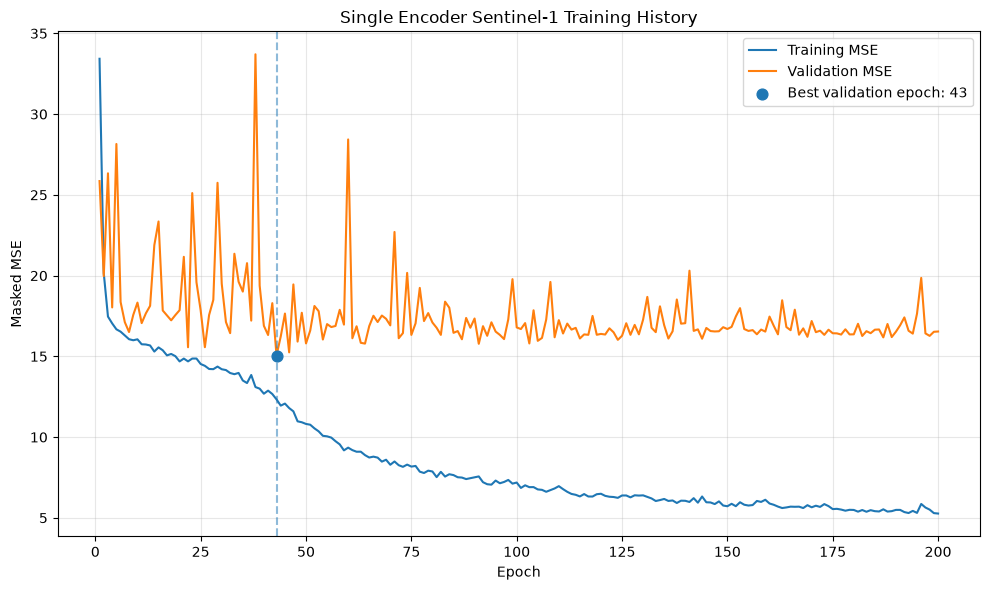

In [ ]:
# Plot S1 only training history
 
plot_training_history(
    train_losses,
    val_losses,
    best_epoch,
    model_name="Single Encoder Sentinel-1",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s1_training.png"
)

In [12]:
# Test model

test_model(
    model,
    checkpoint_fp,
    mode
)

Test MSE = 15.1281
Test MAE = 2.7645
Test ME = 0.0684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0611..1.2213999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.084400006..1.6892002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0917..1.0248901].


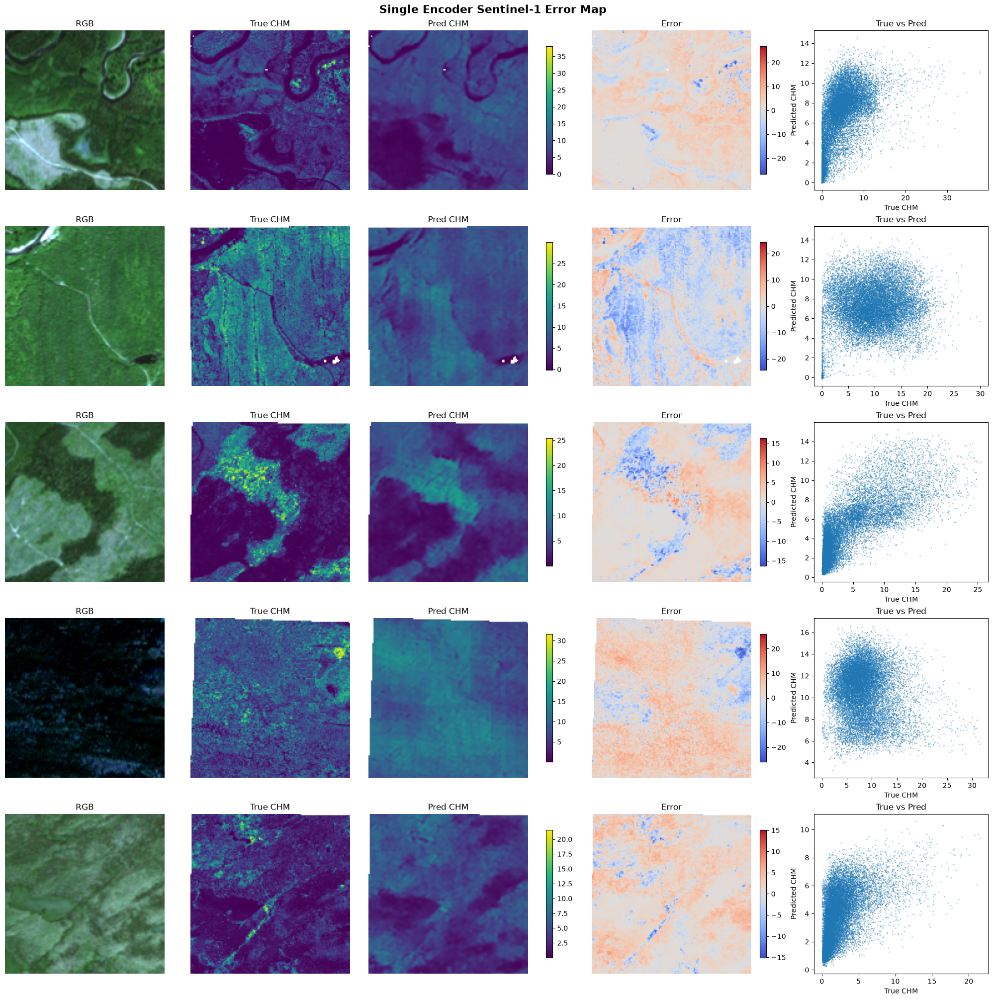

In [13]:
# Spatially map error

map_error(
    model,
    checkpoint_fp,
    mode,
    model_name="Single Encoder Sentinel-1",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s1_error_map.png"
)

## Sentinel-2
---

In [14]:
# Instantiate model and (re)seed data RNG

opt_model = SingleEncoderUNet(n_in_channels=9, n_out_channels=1)

opt_optimizer = torch.optim.Adam(opt_model.parameters(), lr=1e-3)

data_generator.manual_seed(SEED)

# Print model summary
batch_size = BATCH_SIZE
height, width = 128, 128

opt_size = (batch_size, 9, height, width)  # 9 channels

model_summary = summary(
    opt_model, 
    input_size=opt_size,
    col_names=["input_size", "output_size", "num_params", "mult_adds"],
    depth=3 # Controls how deep into submodules the report goes
)

print(model_summary)

Layer (type:depth-idx)                        Input Shape               Output Shape              Param #                   Mult-Adds
SingleEncoderUNet                             [16, 9, 128, 128]         [16, 1, 128, 128]         --                        --
├─Contract: 1-1                               [16, 9, 128, 128]         [16, 256, 16, 16]         --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-1                   [16, 9, 128, 128]         [16, 64, 128, 128]        42,304                    11,022,635,008
│    └─MaxPool2d: 2-2                         [16, 64, 128, 128]        [16, 64, 64, 64]          --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-2                   [16, 64, 64, 64]          [16, 128, 64, 64]   

In [15]:
# Train Seninel-2 model

model=opt_model.to(device)
optimizer=opt_optimizer
mode="opt"
epochs=200
checkpoint_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/models/weights/best_opt_unet.pth"
resume=False
patience=np.inf
min_delta=0.0

train_losses, val_losses, best_epoch = train_model(
    model,
    optimizer,
    mode,
    epochs,
    checkpoint_fp,
    resume,
    patience,
    min_delta
)

Training model: 100%|██████████| 200/200 [1:07:20<00:00, 20.20s/it]


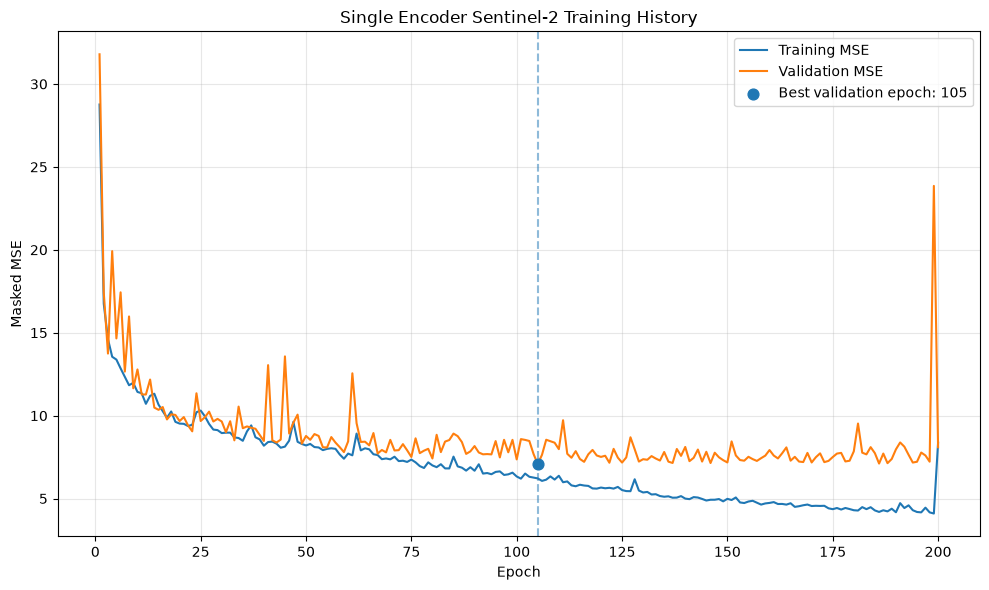

In [16]:
# Plot S2 training history

plot_training_history(
    train_losses,
    val_losses,
    best_epoch,
    model_name="Single Encoder Sentinel-2",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s2_training.png"
)

In [17]:
# Test model

test_model(
    model,
    checkpoint_fp,
    mode
)

Test MSE = 6.9837
Test MAE = 1.7532
Test ME = 0.1961


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0611..1.2213999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.084400006..1.6892002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0917..1.0248901].


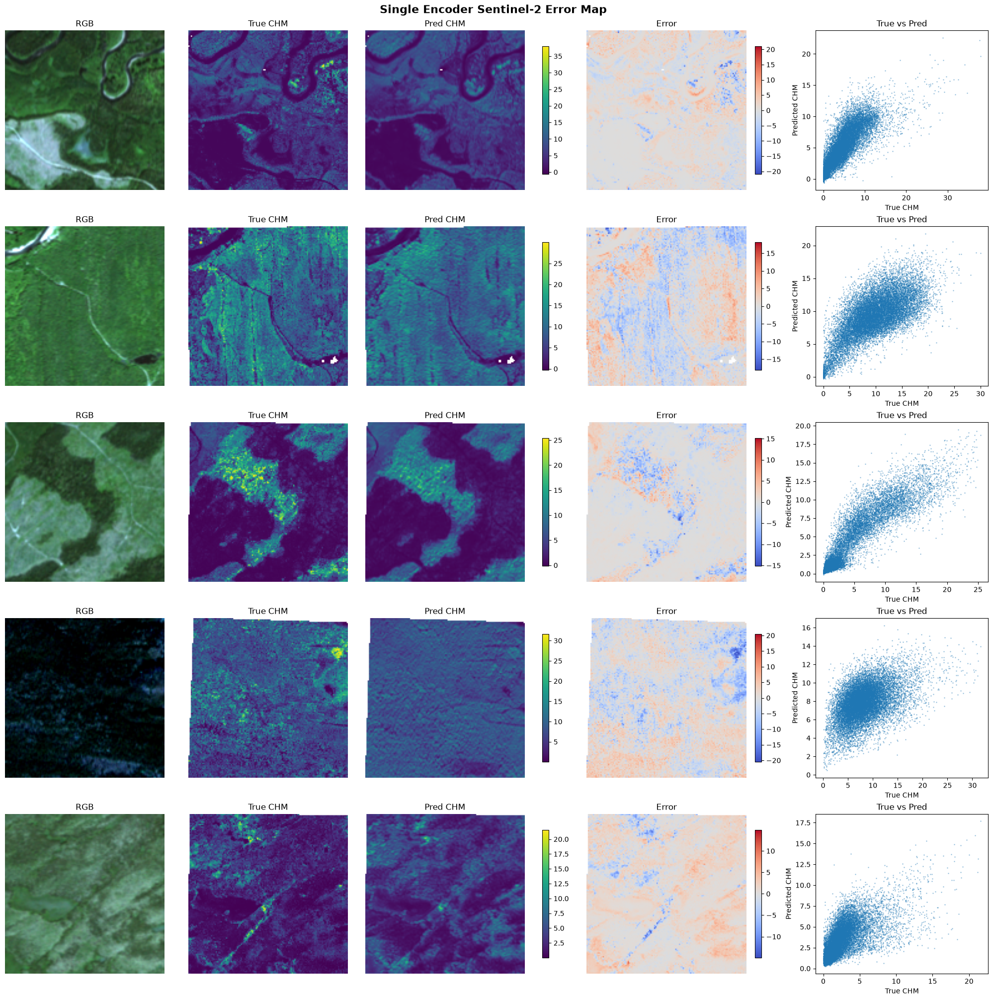

In [18]:
# Spatially map error

map_error(
    model,
    checkpoint_fp,
    mode,
    model_name="Single Encoder Sentinel-2",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s2_error_map.png"
)

## Sentinel-1 & Sentinel-2 Fusion
---

In [8]:
# Instantiate model and (re)seed data RNG

dual_enc_model = DualEncoderUNet(n_sar_channels=2, n_opt_channels=9, n_out_channels=1)

dual_enc_optimizer = torch.optim.Adam(dual_enc_model.parameters(), lr=1e-3)

data_generator.manual_seed(SEED)

# Print model summary
batch_size = 16
height, width = 128, 128

sar_size = (batch_size, 2, height, width)  # 2 channels
opt_size = (batch_size, 9, height, width)  # 9 channels

model_summary = summary(
    dual_enc_model, 
    input_size=[sar_size, opt_size],
    col_names=["input_size", "output_size", "num_params", "mult_adds"],
    depth=3 # Controls how deep into submodules (like self.sar_enc) the report goes
)

print(model_summary)

Layer (type:depth-idx)                        Input Shape               Output Shape              Param #                   Mult-Adds
DualEncoderUNet                               [16, 2, 128, 128]         [16, 1, 128, 128]         --                        --
├─Contract: 1-1                               [16, 2, 128, 128]         [16, 256, 16, 16]         --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-1                   [16, 2, 128, 128]         [16, 64, 128, 128]        38,272                    9,965,670,400
│    └─MaxPool2d: 2-2                         [16, 64, 128, 128]        [16, 64, 64, 64]          --                        --
│    └─ModuleList: 2-5                        --                        --                        (recursive)               --
│    │    └─DoubleConv: 3-2                   [16, 64, 64, 64]          [16, 128, 64, 64]    

In [ ]:
# Train Dual Encoder U-Net

model=dual_enc_model.to(device)
optimizer=dual_enc_optimizer
mode="dual"
epochs=200 
checkpoint_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/models/weights/best_dual_unet.pth"
resume=False
patience=np.inf
min_delta=0.0

train_losses, val_losses, best_epoch = train_model(
    model,
    optimizer,
    mode,
    epochs,
    checkpoint_fp,
    resume,
    patience,
    min_delta
)

Training model: 100%|█████████▉| 199/200 [1:11:28<00:21, 21.55s/it]

In [ ]:
# Plot Dual Encoder training history

plot_training_history(
    train_losses,
    val_losses,
    best_epoch,
    model_name="Dual Encoder Sentinel-1 & Sentinel-2",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s1s2_training.png"
)

In [10]:
# Test model

test_model(
    model,
    checkpoint_fp,
    mode
)

Test MSE = 6.5815
Test MAE = 1.6697
Test ME = 0.1086


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0611..1.2213999].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.084400006..1.6892002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0917..1.0248901].


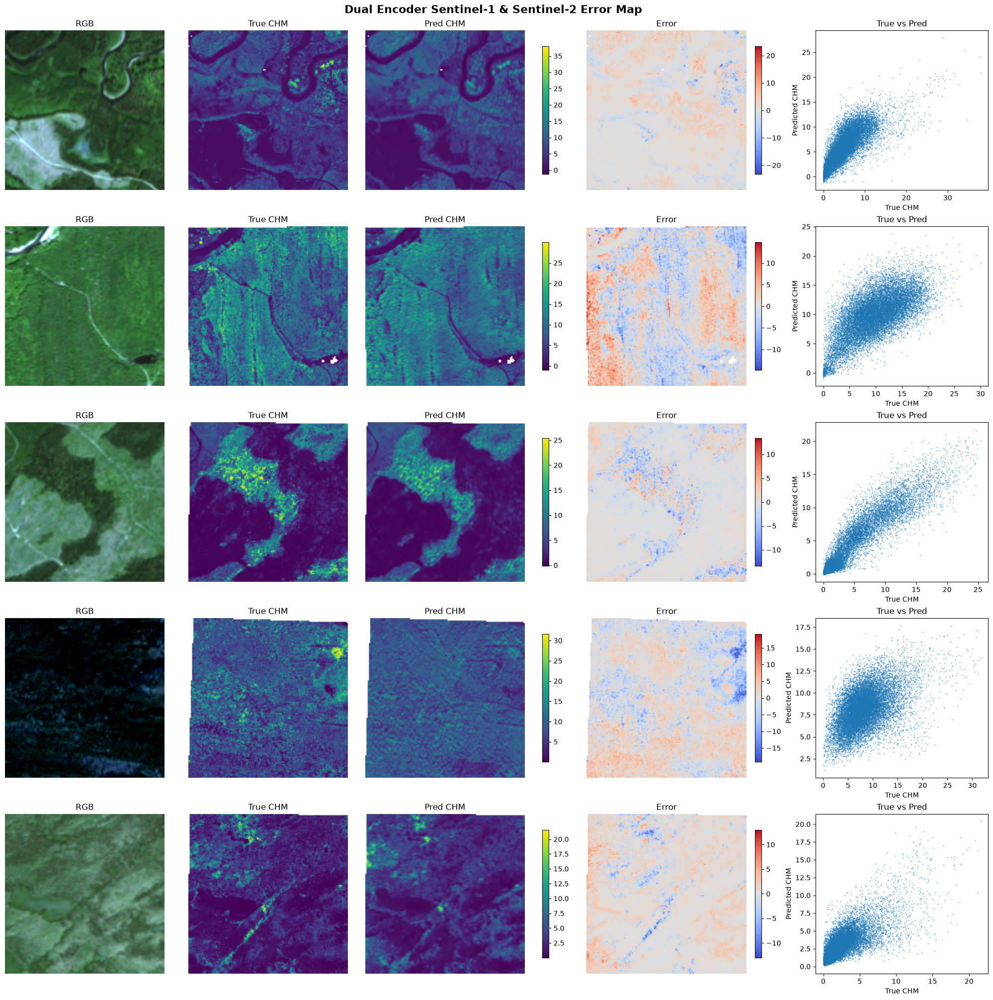

In [11]:
# Spatially map error

map_error(
    model,
    checkpoint_fp,
    mode,
    model_name="Dual Encoder Sentinel-1 & Sentinel-2",
    fig_fp="/mnt/c/Users/sebas/Documents/projects/multimodal-canopy/data/s1s2_error_map.png"
)